In [69]:
from keras.preprocessing.image import ImageDataGenerator

In [70]:
from keras import layers, models, optimizers

In [71]:
dataset_dir = './dataset'

In [72]:
import os

In [73]:
train_dir = os.path.join(dataset_dir, 'train')

In [74]:
train_gen = ImageDataGenerator(
    rescale = 1./255,
    rotation_range = 40,
    zoom_range = 0.2,
    shear_range = 0.2,
    height_shift_range = 0.2,
    width_shift_range = 0.2,
    fill_mode = 'nearest',
)

In [75]:
train_generator = train_gen.flow_from_directory(
    train_dir,
    target_size = (150, 150),
    class_mode = 'categorical',
    batch_size = 5
)

Found 154 images belonging to 8 classes.


In [76]:
def get_model():
    model = models.Sequential()
    model.add(layers.Conv2D(128, (3, 3), activation = 'relu', input_shape = (150, 150, 3)))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(128, (3, 3), activation = 'relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(64, (3, 3), activation = 'relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(64, (3, 3), activation = 'relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(32, (3, 3), activation = 'relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Flatten())
    model.add(layers.Dense(256, activation = 'relu'))
    model.add(layers.Dense(8, activation = 'softmax'))
    
    model.compile(
        optimizer = optimizers.RMSprop(learning_rate = 1e-4),
        loss = 'categorical_crossentropy',
        metrics = ['acc']
    )
    
    return model

In [77]:
model = get_model()

In [78]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_20 (Conv2D)          (None, 148, 148, 128)     3584      
                                                                 
 max_pooling2d_20 (MaxPoolin  (None, 74, 74, 128)      0         
 g2D)                                                            
                                                                 
 conv2d_21 (Conv2D)          (None, 72, 72, 128)       147584    
                                                                 
 max_pooling2d_21 (MaxPoolin  (None, 36, 36, 128)      0         
 g2D)                                                            
                                                                 
 conv2d_22 (Conv2D)          (None, 34, 34, 64)        73792     
                                                                 
 max_pooling2d_22 (MaxPoolin  (None, 17, 17, 64)      

In [79]:
history = model.fit(
    train_generator,
    steps_per_epoch = 30,
    epochs = 100
)

Epoch 1/100
30/30 [==============================] - 9s 242ms/step - loss: 2.0687 - acc: 0.1611
Epoch 2/100
30/30 [==============================] - 7s 235ms/step - loss: 2.0297 - acc: 0.1879
Epoch 3/100
30/30 [==============================] - 9s 283ms/step - loss: 2.0079 - acc: 0.1745
Epoch 4/100
30/30 [==============================] - 8s 258ms/step - loss: 1.9270 - acc: 0.2148
Epoch 5/100
30/30 [==============================] - 10s 320ms/step - loss: 1.8420 - acc: 0.2550
Epoch 6/100
30/30 [==============================] - 8s 259ms/step - loss: 1.7358 - acc: 0.3067
Epoch 7/100
30/30 [==============================] - 13s 423ms/step - loss: 1.6443 - acc: 0.3624
Epoch 8/100
30/30 [==============================] - 14s 445ms/step - loss: 1.5818 - acc: 0.4295
Epoch 9/100
30/30 [==============================] - 8s 280ms/step - loss: 1.5075 - acc: 0.4094
Epoch 10/100
30/30 [==============================] - 9s 305ms/step - loss: 1.4799 - acc: 0.4362
Epoch 11/100
30/30 [================

In [81]:
class_map = train_generator.class_indices

In [82]:
inv_class_map = {}

In [83]:
for i, j in class_map.items():
    inv_class_map[j] = i

In [84]:
test_dir = os.path.join(dataset_dir, 'test')

In [85]:
import os
class_test_dir = os.listdir(test_dir)
import keras.utils as image
import numpy as np
import matplotlib.pyplot as plt

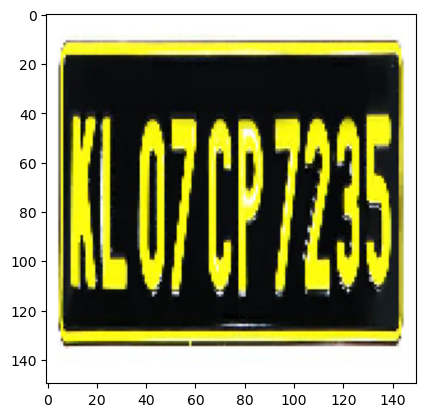

1/1 [==============================] - 0s 34ms/step
[*] Predicted Class :: rental  <-> Actual class :: rental


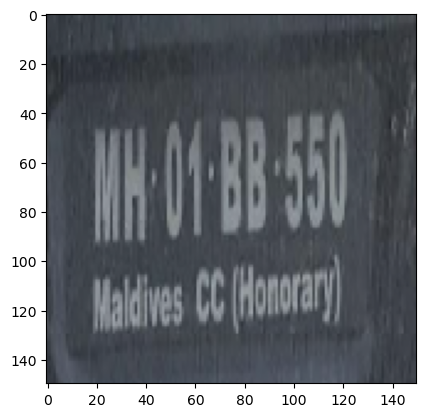

1/1 [==============================] - 0s 50ms/step
[*] Predicted Class :: Military  <-> Actual class :: rental


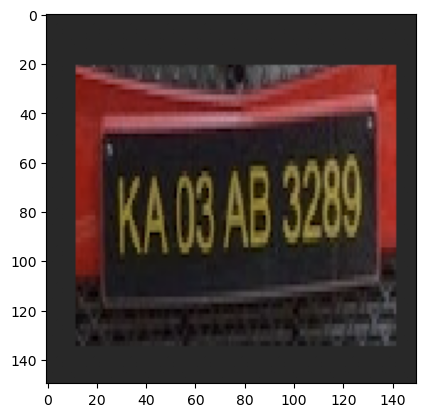

1/1 [==============================] - 0s 46ms/step
[*] Predicted Class :: rental  <-> Actual class :: rental


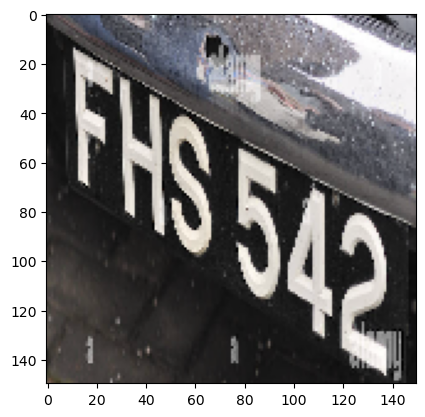

1/1 [==============================] - 0s 50ms/step
[*] Predicted Class :: rental  <-> Actual class :: rental


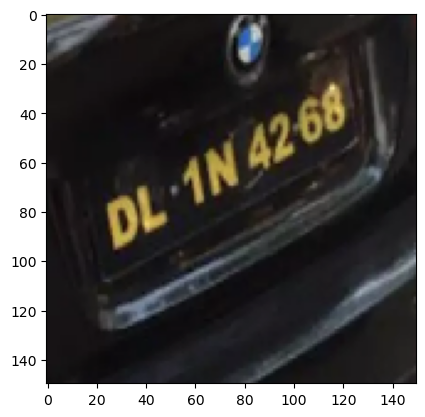

1/1 [==============================] - 0s 57ms/step
[*] Predicted Class :: rental  <-> Actual class :: rental


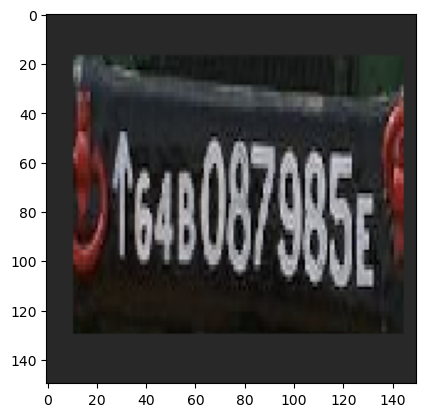

1/1 [==============================] - 0s 49ms/step
[*] Predicted Class :: Military  <-> Actual class :: Military


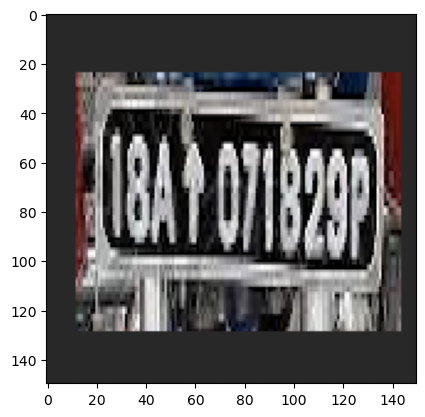

1/1 [==============================] - 0s 36ms/step
[*] Predicted Class :: Military  <-> Actual class :: Military


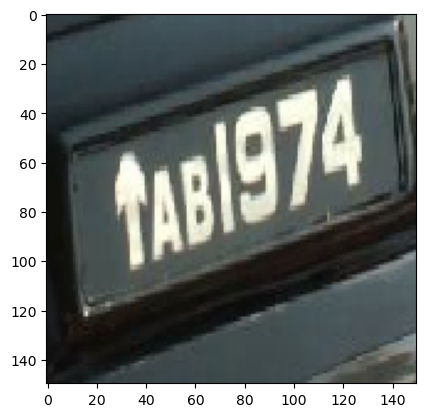

1/1 [==============================] - 0s 38ms/step
[*] Predicted Class :: Military  <-> Actual class :: Military


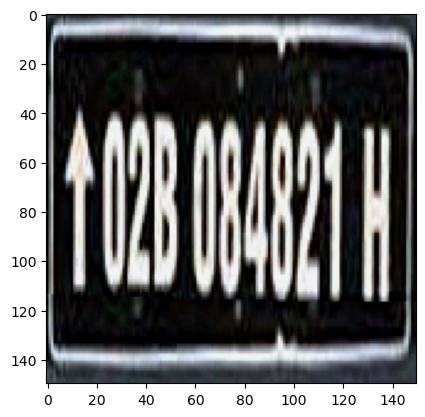

1/1 [==============================] - 0s 37ms/step
[*] Predicted Class :: Military  <-> Actual class :: Military


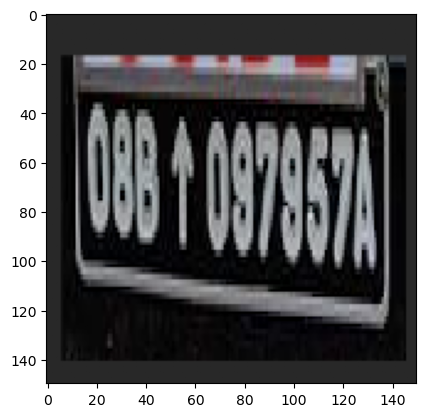

1/1 [==============================] - 0s 33ms/step
[*] Predicted Class :: Military  <-> Actual class :: Military


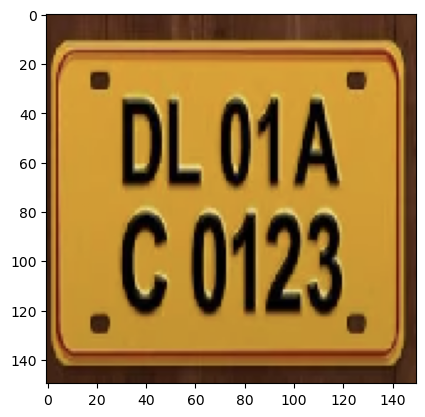

1/1 [==============================] - 0s 39ms/step
[*] Predicted Class :: commercial  <-> Actual class :: commercial


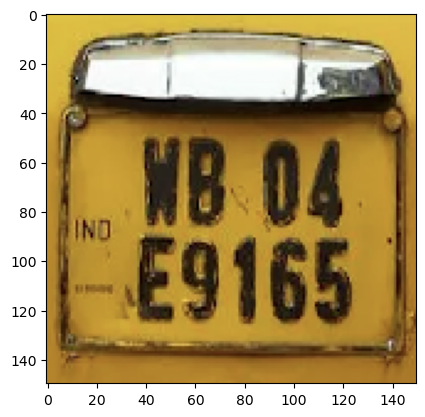

1/1 [==============================] - 0s 57ms/step
[*] Predicted Class :: commercial  <-> Actual class :: commercial


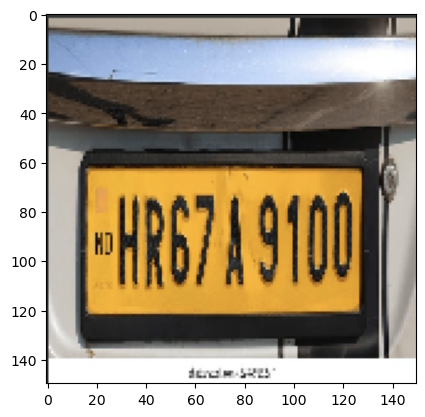

1/1 [==============================] - 0s 41ms/step
[*] Predicted Class :: commercial  <-> Actual class :: commercial


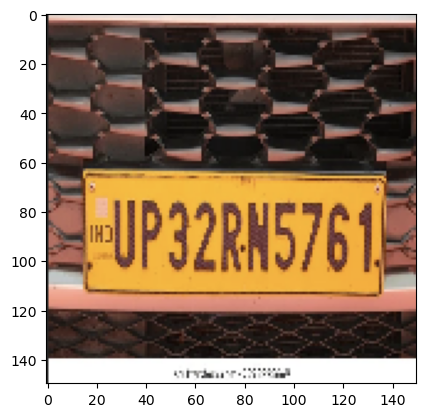

1/1 [==============================] - 0s 47ms/step
[*] Predicted Class :: commercial  <-> Actual class :: commercial


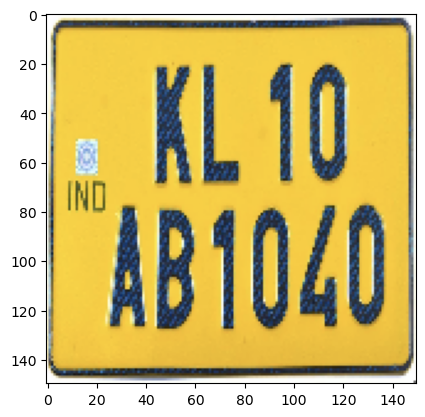

1/1 [==============================] - 0s 39ms/step
[*] Predicted Class :: rental  <-> Actual class :: commercial


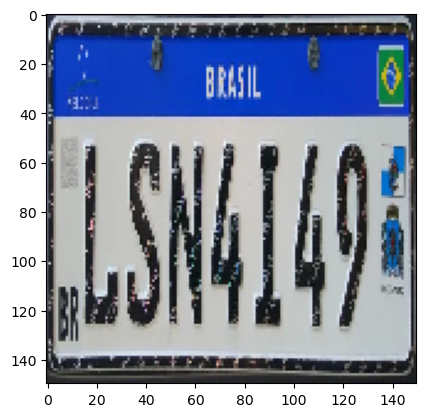

1/1 [==============================] - 0s 39ms/step
[*] Predicted Class :: foregin  <-> Actual class :: foregin


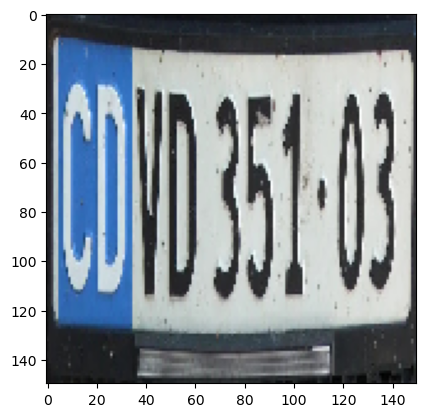

1/1 [==============================] - 0s 34ms/step
[*] Predicted Class :: foregin  <-> Actual class :: foregin


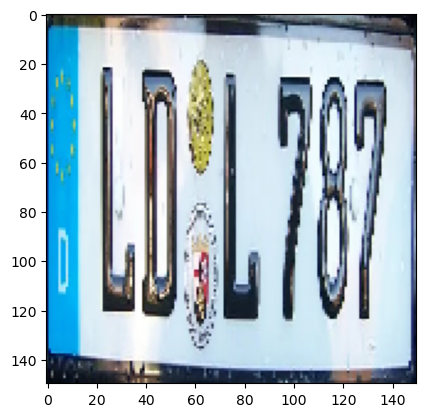

1/1 [==============================] - 0s 38ms/step
[*] Predicted Class :: foregin  <-> Actual class :: foregin


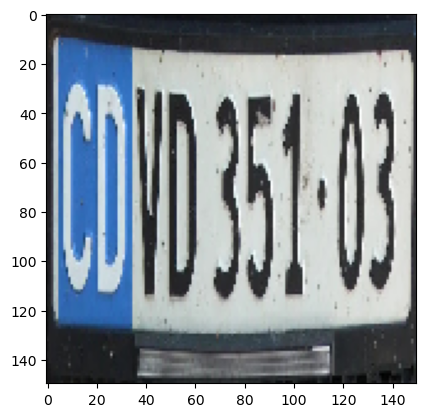

1/1 [==============================] - 0s 42ms/step
[*] Predicted Class :: foregin  <-> Actual class :: foregin


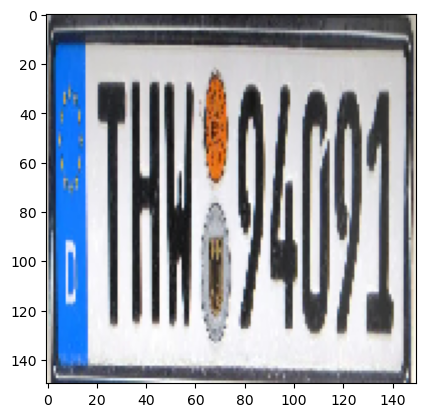

1/1 [==============================] - 0s 44ms/step
[*] Predicted Class :: foregin  <-> Actual class :: foregin


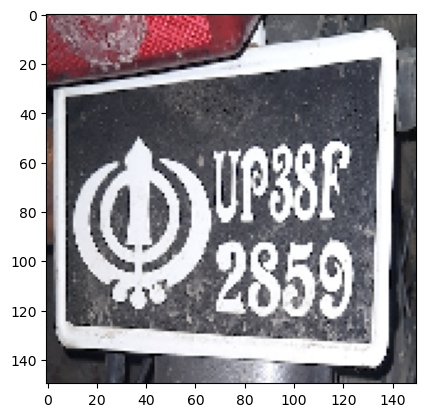

1/1 [==============================] - 0s 35ms/step
[*] Predicted Class :: Military  <-> Actual class :: common


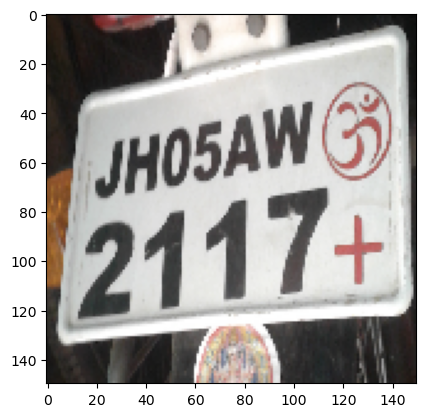

1/1 [==============================] - 0s 48ms/step
[*] Predicted Class :: common  <-> Actual class :: common


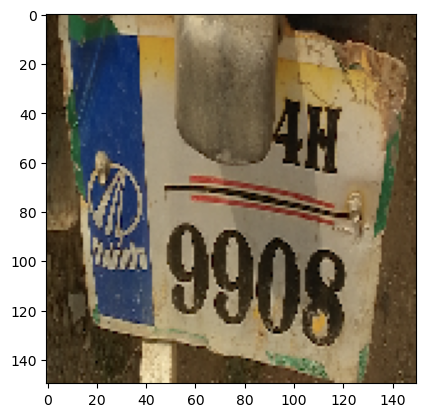

1/1 [==============================] - 0s 43ms/step
[*] Predicted Class :: foregin  <-> Actual class :: common


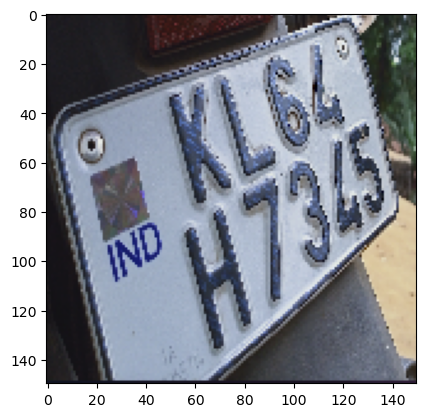

1/1 [==============================] - 0s 45ms/step
[*] Predicted Class :: foregin  <-> Actual class :: common


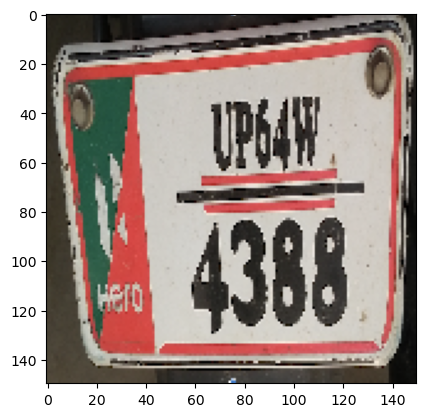

1/1 [==============================] - 0s 34ms/step
[*] Predicted Class :: common  <-> Actual class :: common


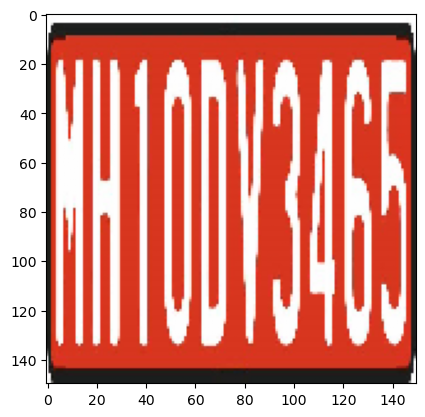

1/1 [==============================] - 0s 45ms/step
[*] Predicted Class :: temporary  <-> Actual class :: temporary


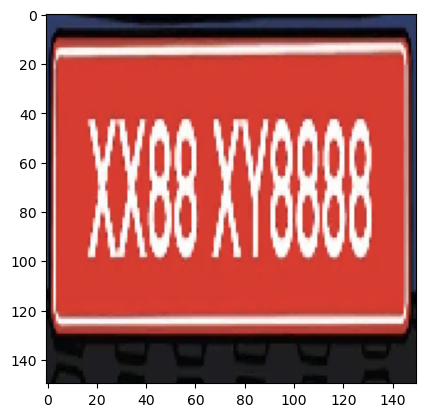

1/1 [==============================] - 0s 39ms/step
[*] Predicted Class :: temporary  <-> Actual class :: temporary


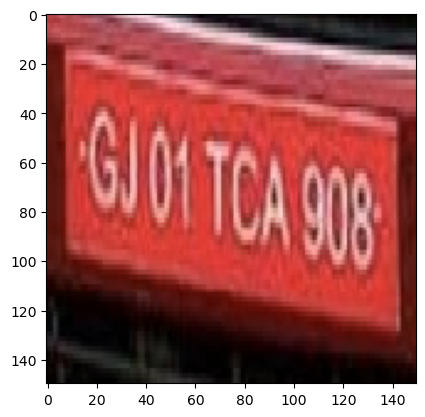

1/1 [==============================] - 0s 36ms/step
[*] Predicted Class :: temporary  <-> Actual class :: temporary


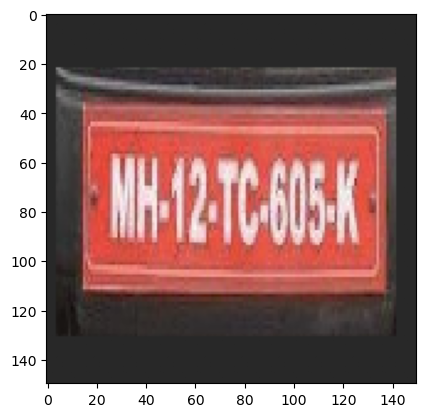

1/1 [==============================] - 0s 35ms/step
[*] Predicted Class :: temporary  <-> Actual class :: temporary


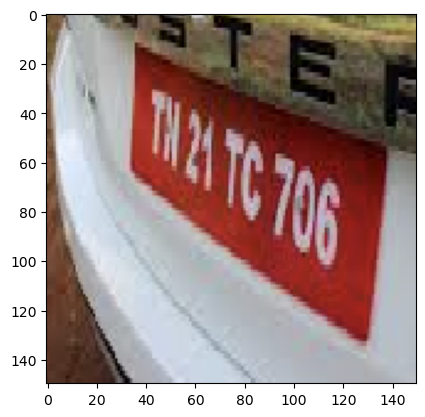

1/1 [==============================] - 0s 34ms/step
[*] Predicted Class :: temporary  <-> Actual class :: temporary


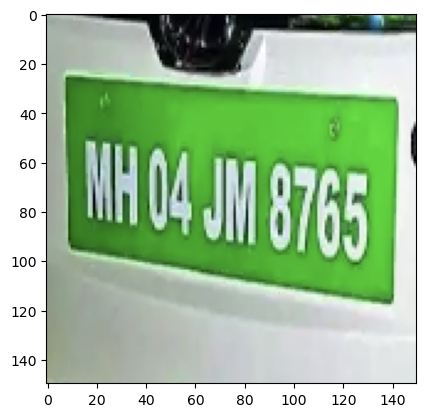

1/1 [==============================] - 0s 32ms/step
[*] Predicted Class :: electric  <-> Actual class :: electric


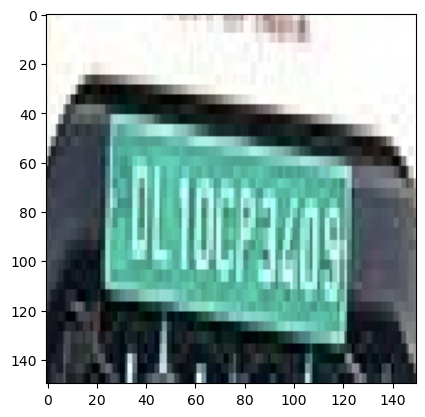

1/1 [==============================] - 0s 34ms/step
[*] Predicted Class :: electric  <-> Actual class :: electric


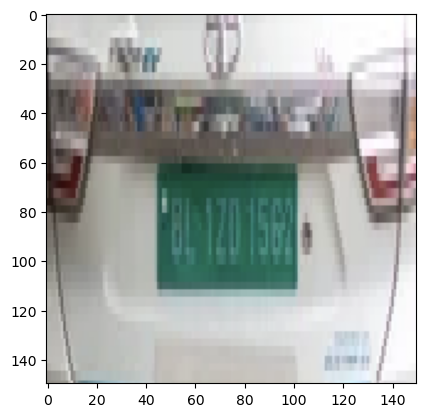

1/1 [==============================] - 0s 78ms/step
[*] Predicted Class :: electric  <-> Actual class :: electric


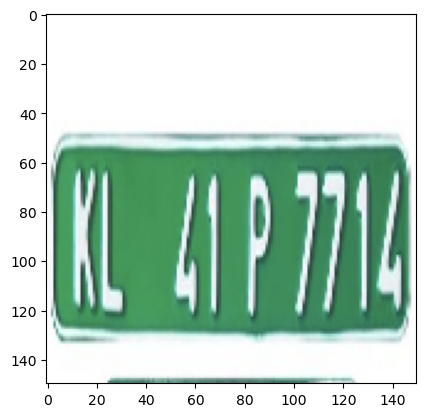

1/1 [==============================] - 0s 34ms/step
[*] Predicted Class :: electric  <-> Actual class :: electric


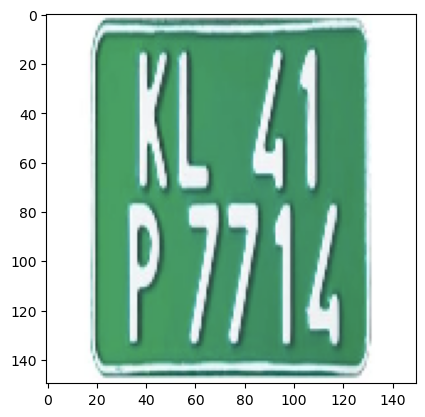

1/1 [==============================] - 0s 36ms/step
[*] Predicted Class :: electric  <-> Actual class :: electric


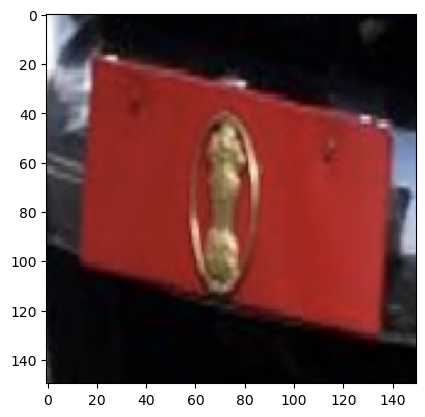

1/1 [==============================] - 0s 38ms/step
[*] Predicted Class :: PresidentOfIndia  <-> Actual class :: PresidentOfIndia


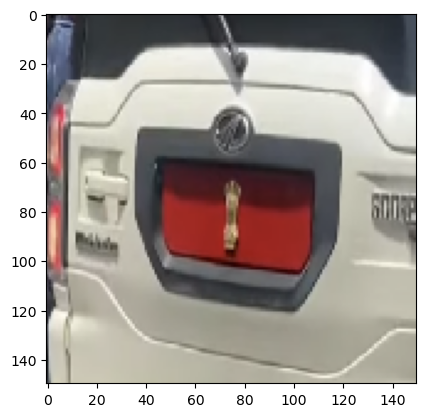

1/1 [==============================] - 0s 36ms/step
[*] Predicted Class :: temporary  <-> Actual class :: PresidentOfIndia


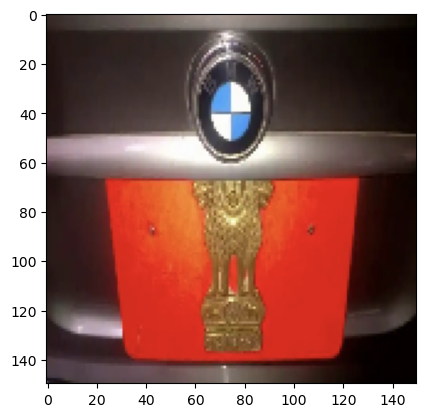

1/1 [==============================] - 0s 38ms/step
[*] Predicted Class :: PresidentOfIndia  <-> Actual class :: PresidentOfIndia


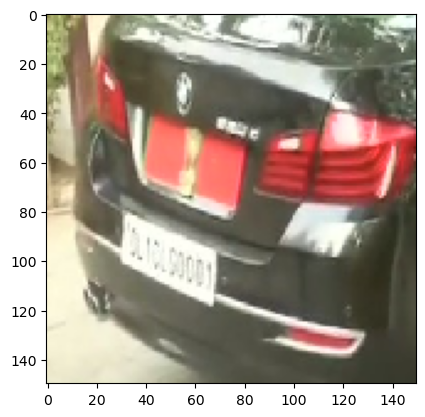

1/1 [==============================] - 0s 34ms/step
[*] Predicted Class :: temporary  <-> Actual class :: PresidentOfIndia


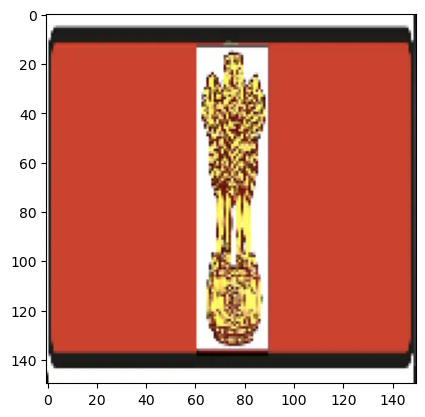

1/1 [==============================] - 0s 38ms/step
[*] Predicted Class :: temporary  <-> Actual class :: PresidentOfIndia


In [94]:
for cl in class_test_dir:
    class_test_path = os.path.join(test_dir, cl)
    if cl=='.DS_Store':
        continue
    for i in os.listdir(class_test_path):
        if i=='.DS_Store':
            continue
        img_path = os.path.join(class_test_path, i)
        img = image.load_img(img_path, target_size= (150, 150))
        img_tensor = image.img_to_array(img)
        img_tensor = np.expand_dims(img_tensor, axis = 0)
        img_tensor /= 255
        plt.imshow(img_tensor[0])
        plt.show()
        pred = np.argmax(model.predict(img_tensor))
        
        class_pred = inv_class_map[pred]
        print(f"[*] Predicted Class :: {class_pred}  <-> Actual class :: {cl}")
        

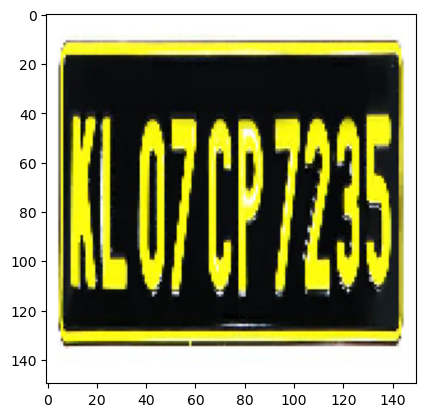

1/1 [==============================] - 0s 43ms/step
[*] Predicted Class :: rental  <-> Actual class :: rental


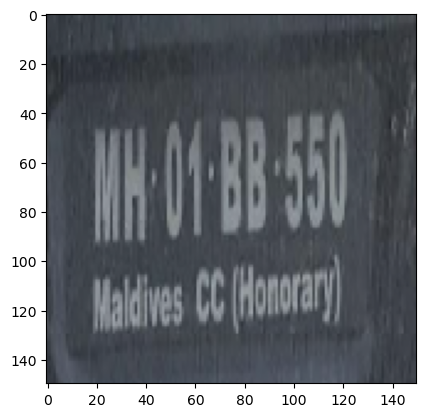

1/1 [==============================] - 0s 40ms/step
[*] Predicted Class :: Military  <-> Actual class :: rental


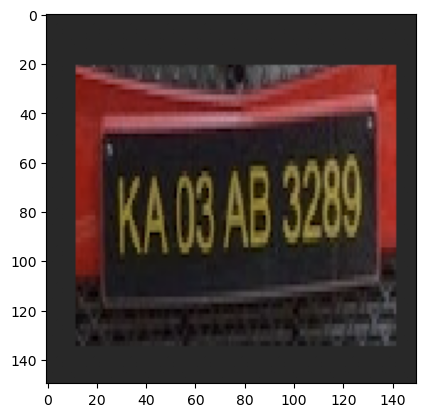

1/1 [==============================] - 0s 35ms/step
[*] Predicted Class :: rental  <-> Actual class :: rental


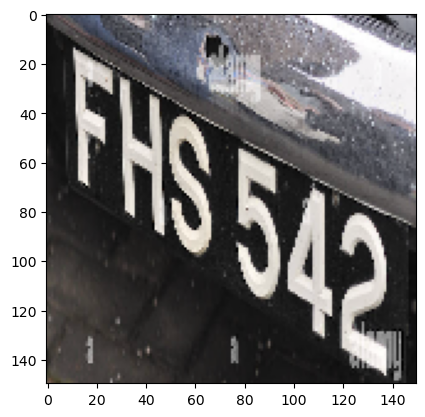

1/1 [==============================] - 0s 40ms/step
[*] Predicted Class :: rental  <-> Actual class :: rental


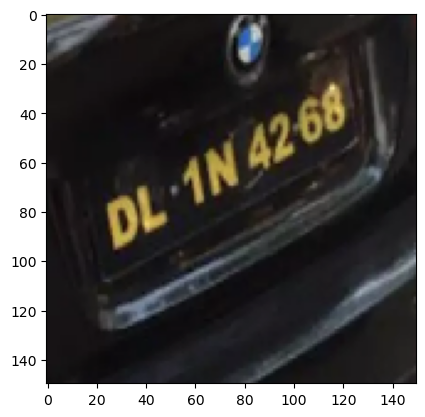

1/1 [==============================] - 0s 44ms/step
[*] Predicted Class :: rental  <-> Actual class :: rental


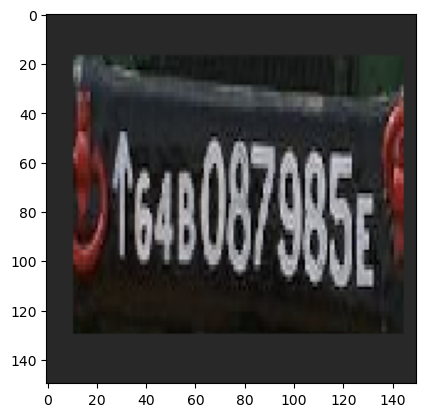

1/1 [==============================] - 0s 34ms/step
[*] Predicted Class :: Military  <-> Actual class :: Military


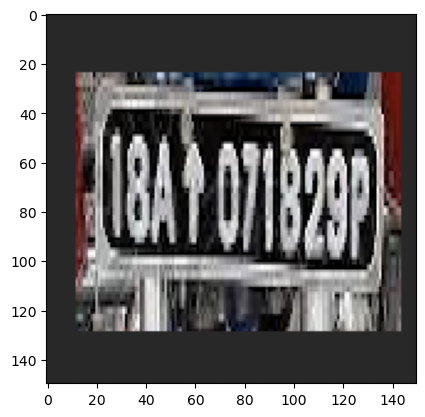

1/1 [==============================] - 0s 40ms/step
[*] Predicted Class :: Military  <-> Actual class :: Military


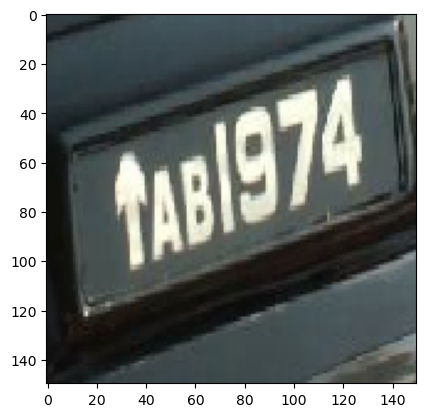

1/1 [==============================] - 0s 61ms/step
[*] Predicted Class :: Military  <-> Actual class :: Military


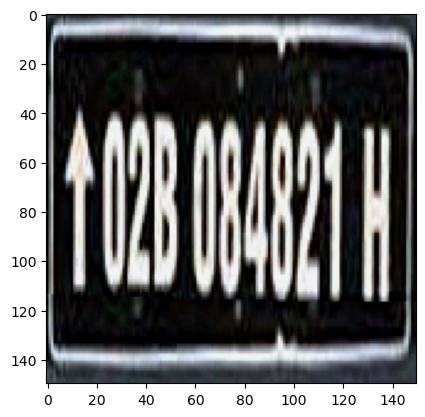

1/1 [==============================] - 0s 41ms/step
[*] Predicted Class :: Military  <-> Actual class :: Military


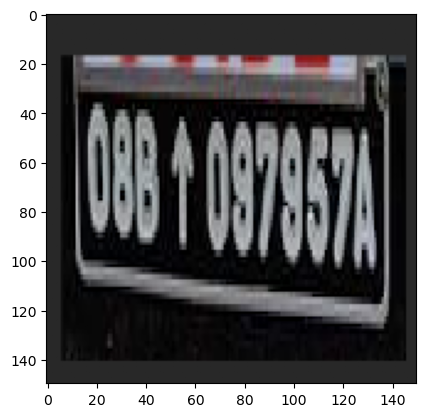

1/1 [==============================] - 0s 34ms/step
[*] Predicted Class :: Military  <-> Actual class :: Military


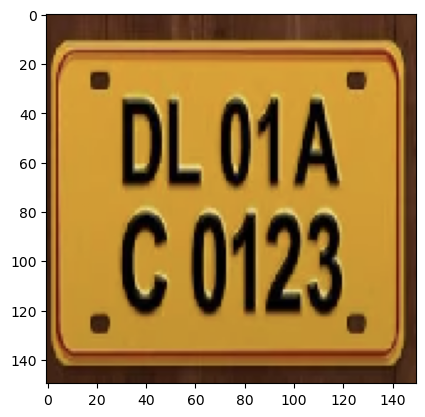

1/1 [==============================] - 0s 35ms/step
[*] Predicted Class :: commercial  <-> Actual class :: commercial


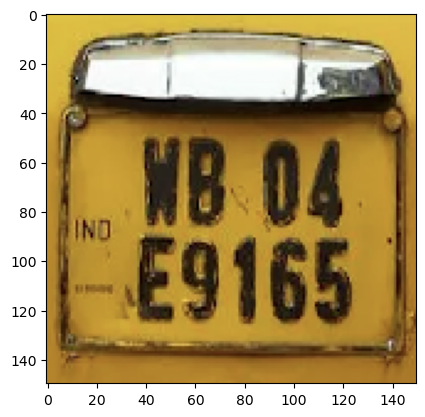

1/1 [==============================] - 0s 32ms/step
[*] Predicted Class :: commercial  <-> Actual class :: commercial


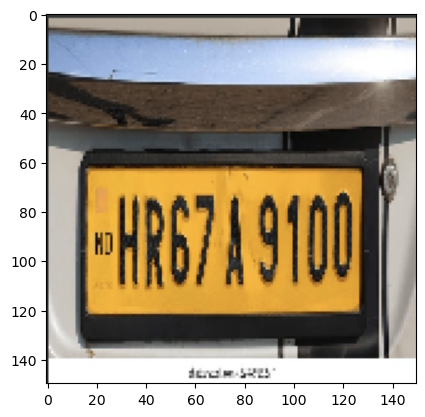

1/1 [==============================] - 0s 36ms/step
[*] Predicted Class :: commercial  <-> Actual class :: commercial


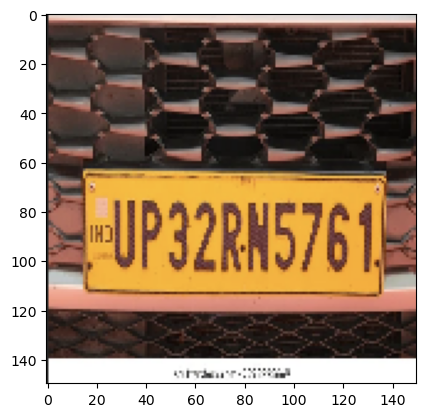

1/1 [==============================] - 0s 36ms/step
[*] Predicted Class :: commercial  <-> Actual class :: commercial


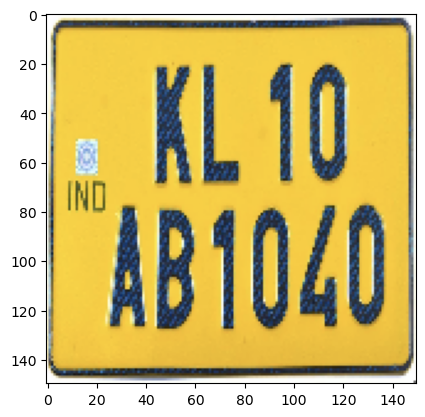

1/1 [==============================] - 0s 35ms/step
[*] Predicted Class :: rental  <-> Actual class :: commercial


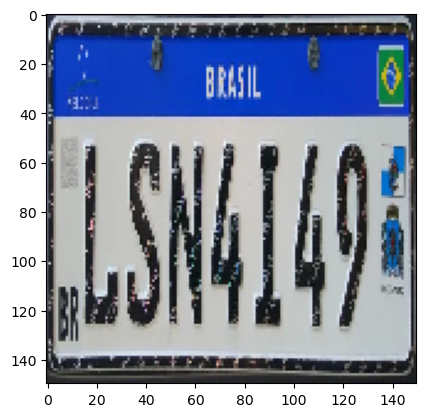

1/1 [==============================] - 0s 35ms/step
[*] Predicted Class :: foregin  <-> Actual class :: foregin


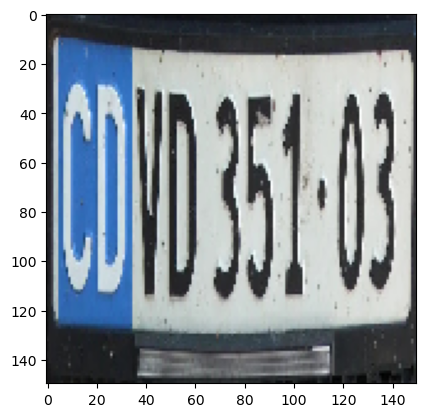

1/1 [==============================] - 0s 37ms/step
[*] Predicted Class :: foregin  <-> Actual class :: foregin


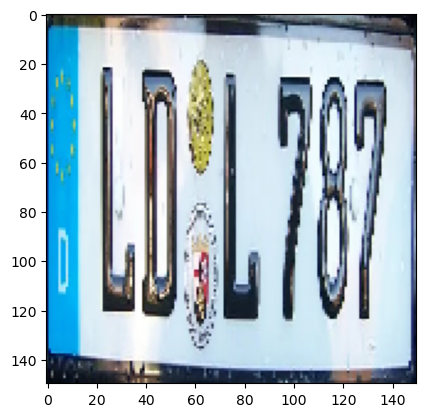

1/1 [==============================] - 0s 38ms/step
[*] Predicted Class :: foregin  <-> Actual class :: foregin


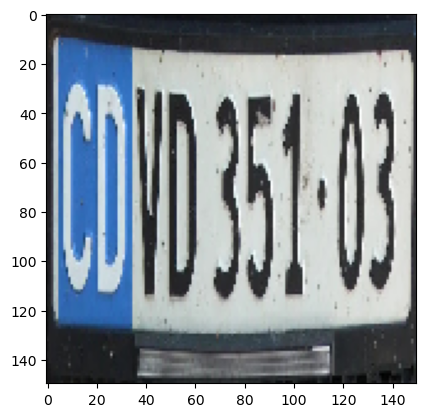

1/1 [==============================] - 0s 46ms/step
[*] Predicted Class :: foregin  <-> Actual class :: foregin


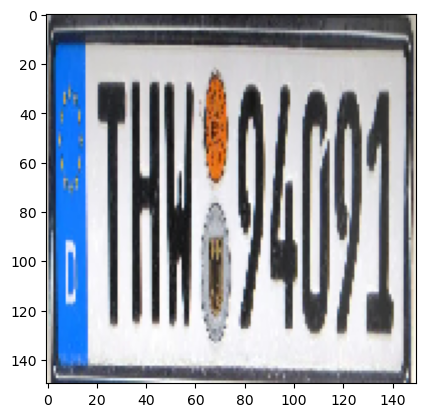

1/1 [==============================] - 0s 42ms/step
[*] Predicted Class :: foregin  <-> Actual class :: foregin


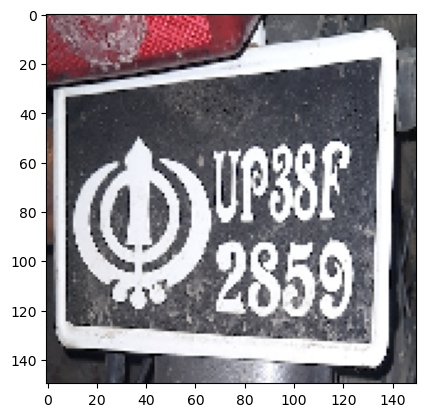

1/1 [==============================] - 0s 36ms/step
[*] Predicted Class :: Military  <-> Actual class :: common


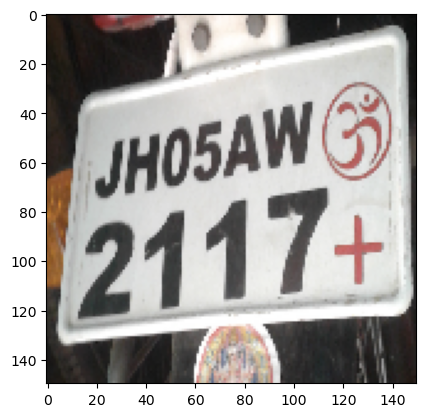

1/1 [==============================] - 0s 39ms/step
[*] Predicted Class :: common  <-> Actual class :: common


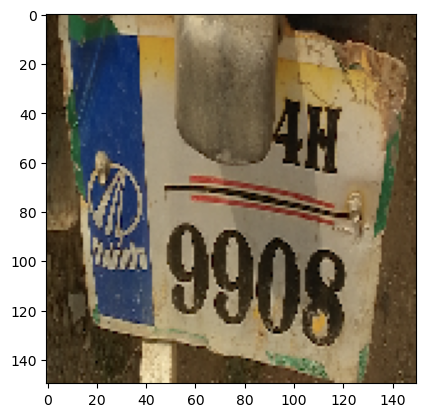

1/1 [==============================] - 0s 34ms/step
[*] Predicted Class :: foregin  <-> Actual class :: common


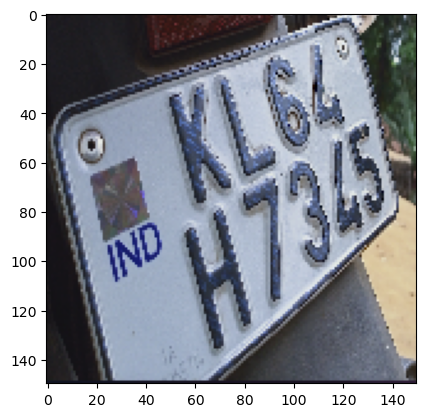

1/1 [==============================] - 0s 49ms/step
[*] Predicted Class :: foregin  <-> Actual class :: common


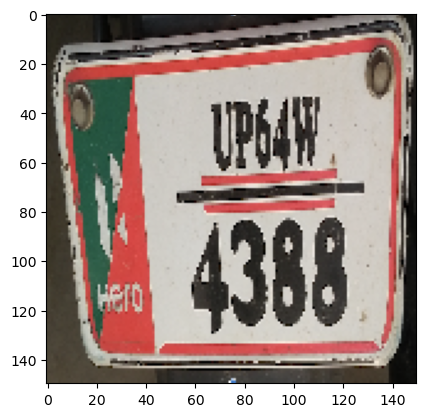

1/1 [==============================] - 0s 34ms/step
[*] Predicted Class :: common  <-> Actual class :: common


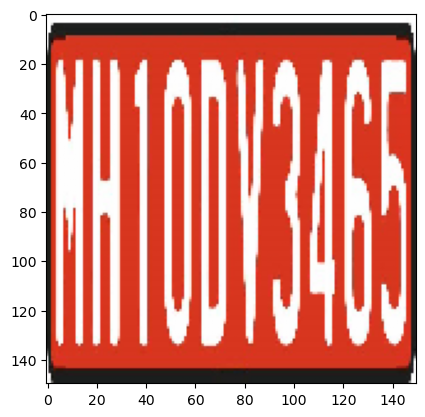

1/1 [==============================] - 0s 34ms/step
[*] Predicted Class :: temporary  <-> Actual class :: temporary


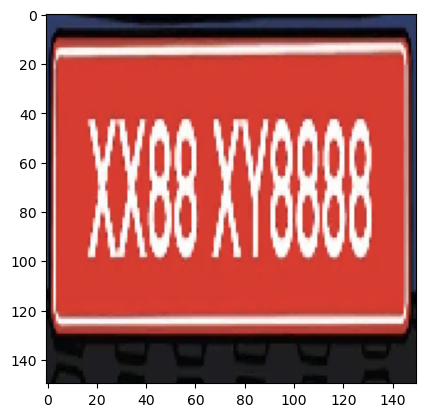

1/1 [==============================] - 0s 36ms/step
[*] Predicted Class :: temporary  <-> Actual class :: temporary


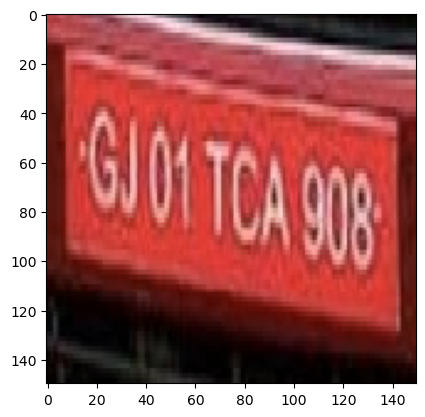

1/1 [==============================] - 0s 35ms/step
[*] Predicted Class :: temporary  <-> Actual class :: temporary


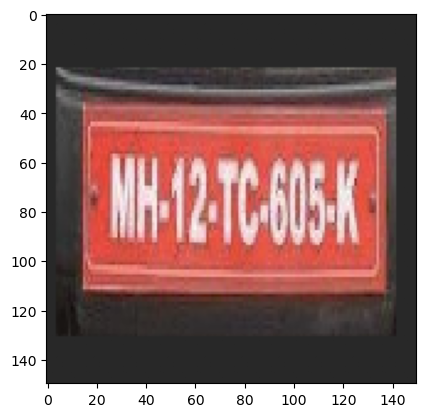

1/1 [==============================] - 0s 33ms/step
[*] Predicted Class :: temporary  <-> Actual class :: temporary


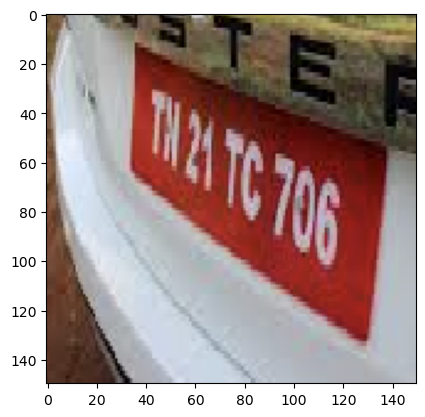

1/1 [==============================] - 0s 35ms/step
[*] Predicted Class :: temporary  <-> Actual class :: temporary


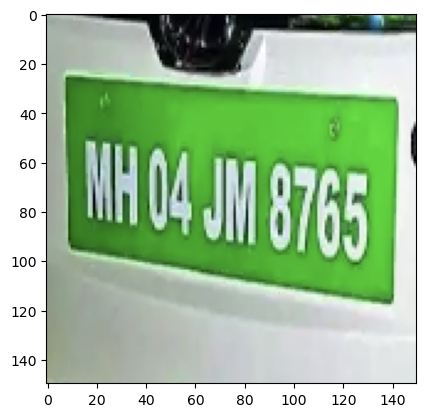

1/1 [==============================] - 0s 35ms/step
[*] Predicted Class :: electric  <-> Actual class :: electric


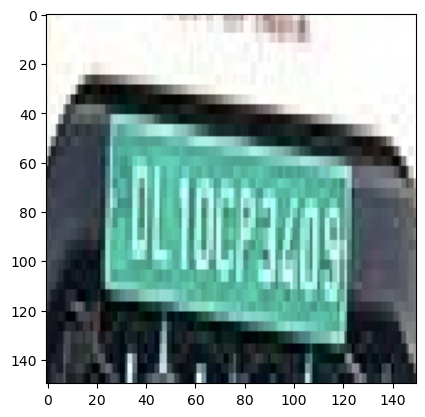

1/1 [==============================] - 0s 36ms/step
[*] Predicted Class :: electric  <-> Actual class :: electric


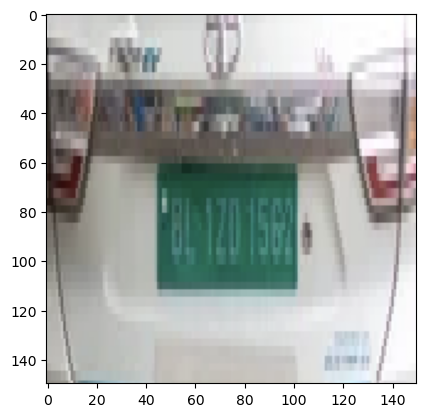

1/1 [==============================] - 0s 34ms/step
[*] Predicted Class :: electric  <-> Actual class :: electric


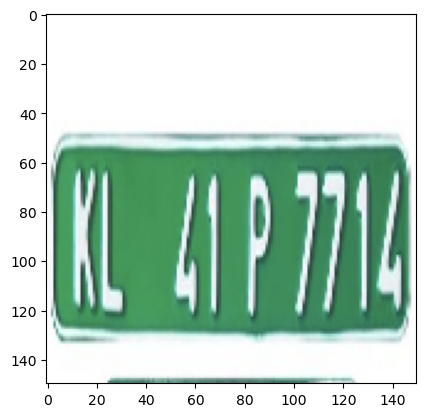

1/1 [==============================] - 0s 30ms/step
[*] Predicted Class :: electric  <-> Actual class :: electric


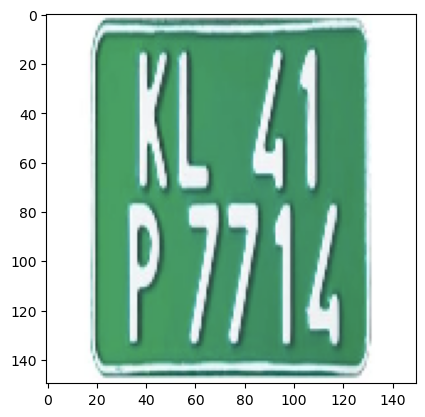

1/1 [==============================] - 0s 35ms/step
[*] Predicted Class :: electric  <-> Actual class :: electric


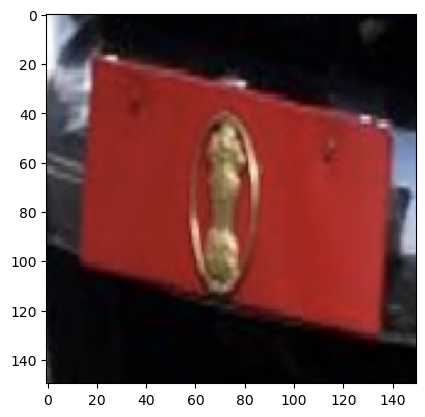

1/1 [==============================] - 0s 34ms/step
[*] Predicted Class :: PresidentOfIndia  <-> Actual class :: PresidentOfIndia


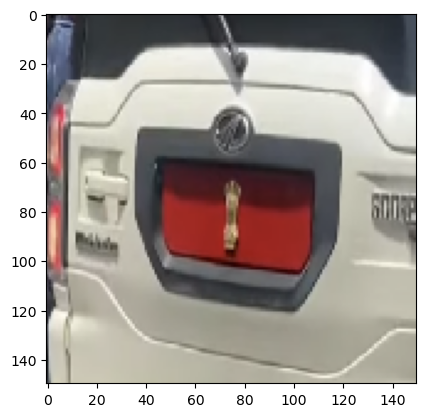

1/1 [==============================] - 0s 34ms/step
[*] Predicted Class :: temporary  <-> Actual class :: PresidentOfIndia


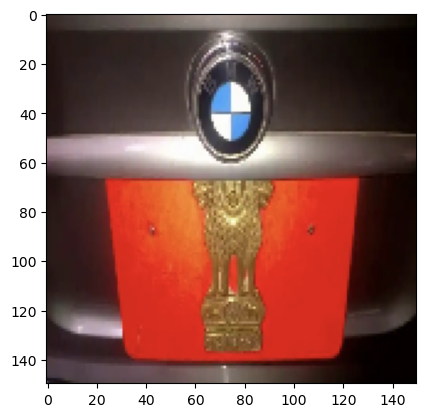

1/1 [==============================] - 0s 34ms/step
[*] Predicted Class :: PresidentOfIndia  <-> Actual class :: PresidentOfIndia


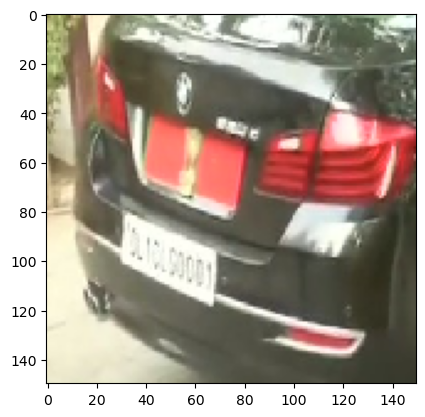

1/1 [==============================] - 0s 42ms/step
[*] Predicted Class :: temporary  <-> Actual class :: PresidentOfIndia


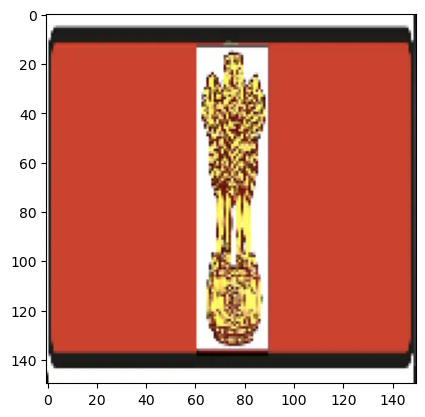

1/1 [==============================] - 0s 43ms/step
[*] Predicted Class :: temporary  <-> Actual class :: PresidentOfIndia


In [102]:
correct_count = 0
total_count = 0
tp = {}
fp = {}
fn = {}
tn = {}
precision_dict = {}
recall_dict = {}

for cl in class_test_dir:
    tp[cl] = 0
    fp[cl] = 0
    fn[cl] = 0
    tn[cl] = 0
    precision_dict[cl] = 0
    recall_dict[cl] = 0

for cl in class_test_dir:
    class_test_path = os.path.join(test_dir, cl)
    if cl == ".DS_Store":
        continue
    for i in os.listdir(class_test_path):
        if i == ".DS_Store":
            continue
        img_path = os.path.join(class_test_path, i)
        img = image.load_img(img_path, target_size= (150, 150))
        img_tensor = image.img_to_array(img)
        img_tensor = np.expand_dims(img_tensor, axis = 0)
        img_tensor /= 255
        plt.imshow(img_tensor[0])
        plt.show()
        pred = np.argmax(model.predict(img_tensor))
        total_count += 1
        class_pred = inv_class_map[pred]
        if class_pred == cl:
            tp[cl] += 1 
            correct_count += 1
        else:
            fp[class_pred] += 1
            fn[cl] += 1
            
            
        print(f"[*] Predicted Class :: {class_pred}  <-> Actual class :: {cl}")

In [105]:
accuracy = correct_count / total_count
print(accuracy)

0.8


In [100]:
precision_macro_avg = sum(precision_dict.values()) / total_count
recall_macro_avg = sum(recall_dict.values()) / total_count
print(precision_macro_avg)
print(recall_macro_avg)

0.02
0.02


In [101]:
f1_score = 2 * precision_macro_avg * recall_macro_avg / (precision_macro_avg + recall_macro_avg)
print(f1_score)

0.02
